# How to Renovate Your Room

- https://medium.com/@melgor89/generative-interior-design-challenge-2024-2nd-place-solution-6338f19f6fe3

In [7]:
# !pip install git+https://github.com/huggingface/diffusers

In [1]:
from importlib.metadata import version
import cv2
import torch
import numpy as np
from PIL import Image
import torch
import time
from utils import display_images

# print(f"CUDA version: {torch.version.cuda}")
# print(f"Number of GPUs: {torch.cuda.device_count()}")
# for i in range(torch.cuda.device_count()):
#     print(f"GPU {i}: {torch.cuda.get_device_name(i)}")

requirements_by_category = {
    "##### CUDA #####": [
        f"CUDA version: {torch.version.cuda}",
    ],
    "##### Diffusion & AI #####": [
        f"diffusers=={version('diffusers')}",
        f"transformers=={version('transformers')}",
        f"accelerate=={version('accelerate')}",
        f"safetensors=={version('safetensors')}",
        f"torch=={version('torch')}",
        f"xformers=={version('xformers')}",
    ],
    "##### Image Processing #####": [
        f"numpy=={version('numpy')}",
        f"opencv-python-headless=={version('opencv-python-headless')}",
        f"Pillow=={version('Pillow')}",
    ]
}

for category, reqs in requirements_by_category.items():
    print(category)
    for req in sorted(reqs, key=str.lower):
        print(req)
    print()

##### CUDA #####
CUDA version: 12.1

##### Diffusion & AI #####
accelerate==1.9.0
diffusers==0.35.0.dev0
safetensors==0.6.1
torch==2.5.1+cu121
transformers==4.55.0
xformers==0.0.29.post1

##### Image Processing #####
numpy==2.1.2
opencv-python-headless==4.10.0.84
Pillow==9.4.0



# Step 1: txt2img

## runwayml/stable-diffusion-v1-5 [Oct 2022]

- ✅ Просто — нужен только текстовый запрос
- ✅ Быстро — запускается “из коробки”, минимум настроек
- ✅ Хорошо для идей — быстро набросать варианты стилей и атмосферы
- ❌ Нет реализма — модель “фантазирует”, не знает про реальные материалы и планировки
- ❌ Мало деталей — слабое качество, особенно у мелких объектов и текстур
- ❌ Не повторяет комнату — не использует фото, всё с нуля
- ❌ Плохой контроль — нельзя задать точную расстановку мебели, форму комнаты и т.д.

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generation time: 6.24s
Peak GPU memory consumption: 10.28Gb


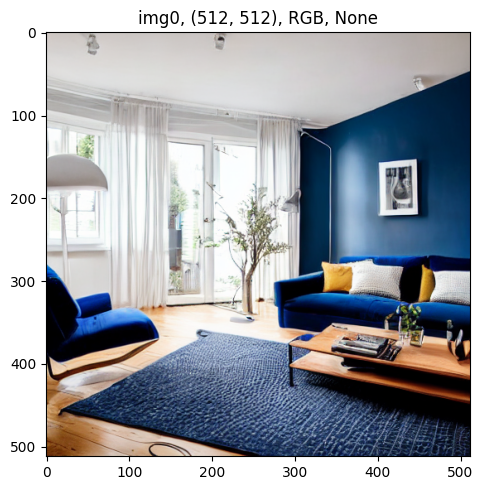

In [12]:
from diffusers import StableDiffusionPipeline


pipe = StableDiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5").to("cuda:2")

prompt = (
    "A living room with a blue velvet sofa against the left wall, "
    "large panoramic windows on the right letting in sunlight, "
    "a modern floor lamp next to the sofa, and a bicycle leaning against the windows. "
    "The style is Scandinavian, with polished wood floors and white walls."
)

torch.cuda.empty_cache()
start_time = time.time()

pipe_result = pipe(prompt=prompt)

end_time = time.time()
generation_time = end_time - start_time

gpu_mem = torch.cuda.max_memory_allocated() / 1024**3

print(f"Generation time: {generation_time:.2f}s")
print(f"Peak GPU memory consumption: {gpu_mem:.2f}Gb")

display_images(pipe_result.images, figsize=(15, 10))

## stabilityai/stable-diffusion-xl-base-1.0 [Jul 2023]

- ✅ Лучше понимает сложные запросы
- ✅ Реалистичнее и детальнее изображения
- ✅ Лучше справляется с расположением предметов и стилями
- ❌ Требует мощную видеокарту (8–12 ГБ+)
- ❌ Всё ещё может ошибаться с расположением/мелкими деталями
- ❌ Дольше генерирует картинку

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generation time: 9.24s
Peak GPU memory consumption: 13.04Gb


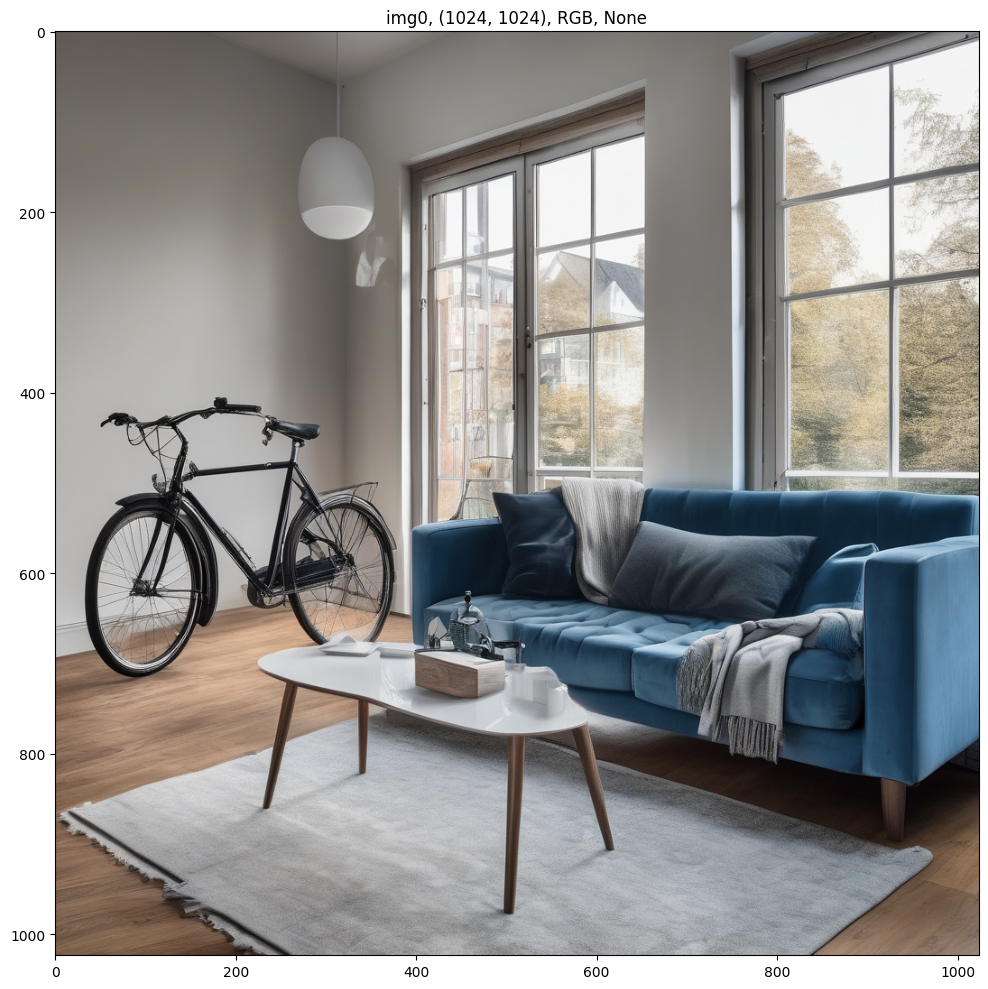

In [16]:
from diffusers import StableDiffusionXLPipeline


pipe = StableDiffusionXLPipeline.from_pretrained("stabilityai/stable-diffusion-xl-base-1.0", torch_dtype=torch.float16).to("cuda:2")

prompt = (
    "A living room with a blue velvet sofa against the left wall, "
    "large panoramic windows on the right letting in sunlight, "
    "a modern floor lamp next to the sofa, and a bicycle leaning against the windows. "
    "The style is Scandinavian, with polished wood floors and white walls."
)

torch.cuda.empty_cache()
start_time = time.time()

pipe_result = pipe(
    prompt=prompt,
    num_inference_steps=50
)

end_time = time.time()
generation_time = end_time - start_time

gpu_mem = torch.cuda.max_memory_allocated() / 1024**3

print(f"Generation time: {generation_time:.2f}s")
print(f"Peak GPU memory consumption: {gpu_mem:.2f}Gb")

display_images(pipe_result.images, figsize=(15, 10))

## Qwen/Qwen-Image [Aug 2025]
- https://huggingface.co/Qwen/Qwen-Image
- https://huggingface.co/DFloat11/Qwen-Image-DF11
- ✅ Максимальное качество (фотореализм, сложные сцены)
- ✅ Понимает длинные и детальные промпты
- ✅ Гибко работает с аспектом, стилями, языками
- ✅ Сильный контроль над композицией и деталями
- ❌ Требует очень мощное “железо” (VRAM 16 ГБ+)
- ❌ Медленнее, чем SDXL
- ❌ Огромный размер модели и ресурсы для запуска

/mnt/ssd/a-lugovoi/anaconda3/envs/py311/lib/python3.11/site-packages/dfloat11/dfloat11.py:18: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources
The config attributes {'pooled_projection_dim': 768} were passed to QwenImageTransformer2DModel, but are not expected and will be ignored. Please verify your config.json configuration file.
Loading DFloat11 safetensors (offloaded to CPU, memory pinned): 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:39<00:00, 39.99s/it]


Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Allocated 339738624 bf16 on device cuda:0


Generation time: 402.03 sec
Peak GPU memory: 15.55 GB


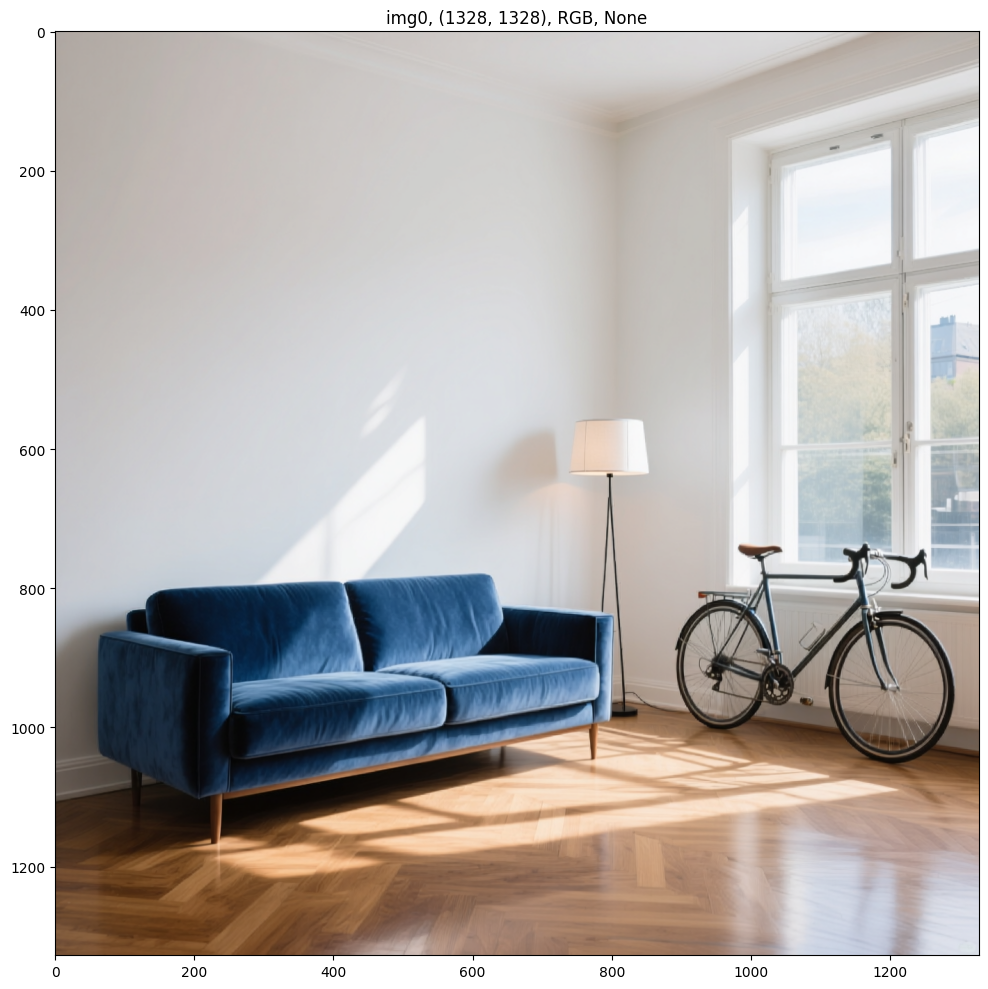

In [2]:
from diffusers import DiffusionPipeline, QwenImageTransformer2DModel
from transformers.modeling_utils import no_init_weights
from dfloat11 import DFloat11Model


device = 'cuda:3'
prompt = (
    "A living room with a blue velvet sofa against the left wall, "
    "large panoramic windows on the right letting in sunlight, "
    "a modern floor lamp next to the sofa, and a bicycle leaning against the windows. "
    "The style is Scandinavian, with polished wood floors and white walls."
)


# Создаем "пустую" модель без инициализации весов для экономии RAM
with no_init_weights():
    transformer = QwenImageTransformer2DModel.from_config(
        QwenImageTransformer2DModel.load_config("Qwen/Qwen-Image", subfolder="transformer"),
    ).to(torch.bfloat16)

# Загружаем квантованные веса DFloat11 в созданную модель
DFloat11Model.from_pretrained(
    "DFloat11/Qwen-Image-DF11",
    device="cpu", # Веса грузятся на CPU для последующей выгрузки
    cpu_offload=True,
    pin_memory=True,
    bfloat16_model=transformer,
)

pipe = DiffusionPipeline.from_pretrained(
    "Qwen/Qwen-Image",
    transformer=transformer,
    torch_dtype=torch.bfloat16,
).to(device)
pipe.enable_model_cpu_offload()

# pipe.enable_sequential_cpu_offload()  # Для весов модели
# pipe.enable_vae_tiling()              # Для тензоров активаций VAE

torch.cuda.empty_cache()
start_time = time.time()

pipe_result = pipe(
    prompt=prompt,
    negative_prompt=" ",
    width=1328,
    height=1328,
    num_inference_steps=50,
    true_cfg_scale=4.0,
    generator=torch.Generator(device=device).manual_seed(42),
)

end_time = time.time()
gpu_mem = torch.cuda.max_memory_allocated() / 1024**3

print(f"Generation time: {end_time - start_time:.2f} sec")
print(f"Peak GPU memory: {gpu_mem:.2f} GB")

display_images(pipe_result.images, figsize=(15, 10))

# Step 1: simple img2img

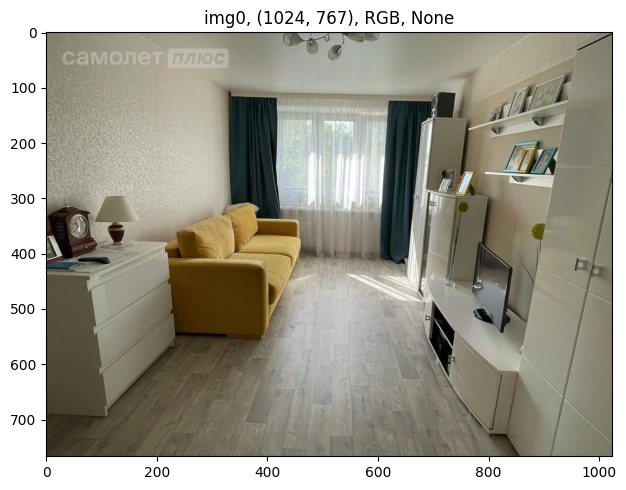

In [2]:
import cv2
import torch
import numpy as np
from PIL import Image
from utils import display_images


DEVICE = 'cuda:2'
img_pil = Image.open('data/img5001_BDorig.png').convert('RGB')
display_images([img_pil])

## img2img stable-diffusion-v15
- https://huggingface.co/docs/diffusers/en/using-diffusers/img2img#stable-diffusion-v15

WARNING[XFORMERS]: xFormers can't load C++/CUDA extensions. xFormers was built for:
    PyTorch 2.5.1+cu121 with CUDA 1201 (you have 2.4.1+cu121)
    Python  3.11.11 (you have 3.11.10)
  Please reinstall xformers (see https://github.com/facebookresearch/xformers#installing-xformers)
  Memory-efficient attention, SwiGLU, sparse and more won't be available.
  Set XFORMERS_MORE_DETAILS=1 for more details


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

safety_checker/model.fp16.safetensors:   0%|          | 0.00/608M [00:00<?, ?B/s]

text_encoder/model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

unet/diffusion_pytorch_model.fp16.safete(…):   0%|          | 0.00/1.72G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

vae/diffusion_pytorch_model.fp16.safeten(…):   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

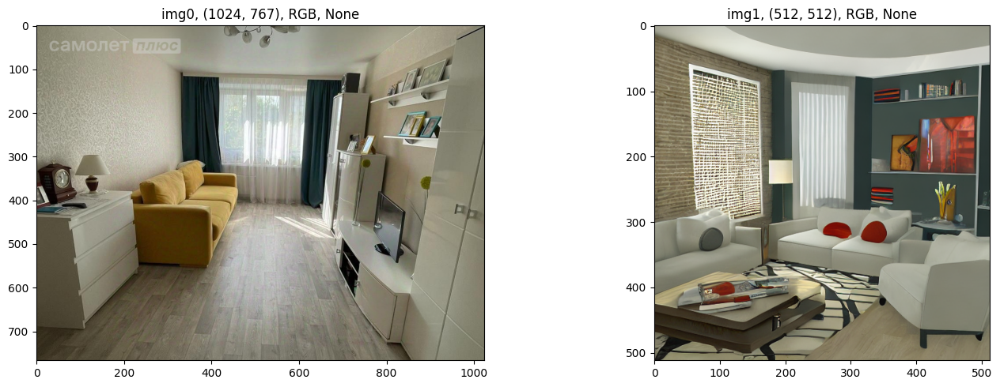

CPU times: user 27.2 s, sys: 13.9 s, total: 41.1 s
Wall time: 1min 32s


In [6]:
%%time

from diffusers import AutoPipelineForImage2Image

pipe = AutoPipelineForImage2Image.from_pretrained(
    "runwayml/stable-diffusion-v1-5", 
    torch_dtype=torch.float16,
    variant="fp16",
    use_safetensors=True
).to(DEVICE)

prompt = "New modern style of livingroom, warm color palette, detailed, 8k"
img_gen = pipe(prompt, image=img_pil.resize((512, 512)), strenght=0.7, num_inference_steps=100)
display_images([img_pil] + img_gen.images)

## img2img stable-diffusion-xl-sdxl
- https://huggingface.co/docs/diffusers/en/using-diffusers/img2img#stable-diffusion-xl-sdxl

In [4]:
%%time

from diffusers import AutoPipelineForImage2Image

pipe = AutoPipelineForImage2Image.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0", 
    torch_dtype=torch.float16,
    variant="fp16",
    use_safetensors=True
).to(DEVICE)

prompt = "New modern style of livingroom, warm color palette, detailed, 8k"

img_gen = pipe(prompt, image=img_pil, strength=0.7, num_inference_steps=100)
display_images([img_pil] + img_gen.images)

RuntimeError: Failed to import diffusers.pipelines.auto_pipeline because of the following error (look up to see its traceback):
Failed to import diffusers.pipelines.cogview4.pipeline_cogview4_control because of the following error (look up to see its traceback):
cannot import name 'GlmModel' from 'transformers' (/mnt/ssd/a-lugovoi/anaconda3/envs/py311/lib/python3.11/site-packages/transformers/__init__.py)

# Step 2: ControlNet txt2img

## diffusers/controlnet-canny-sdxl-1.0

- https://huggingface.co/docs/diffusers/en/api/pipelines/controlnet_sdxl#diffusers.StableDiffusionXLControlNetPipeline.__call__.example

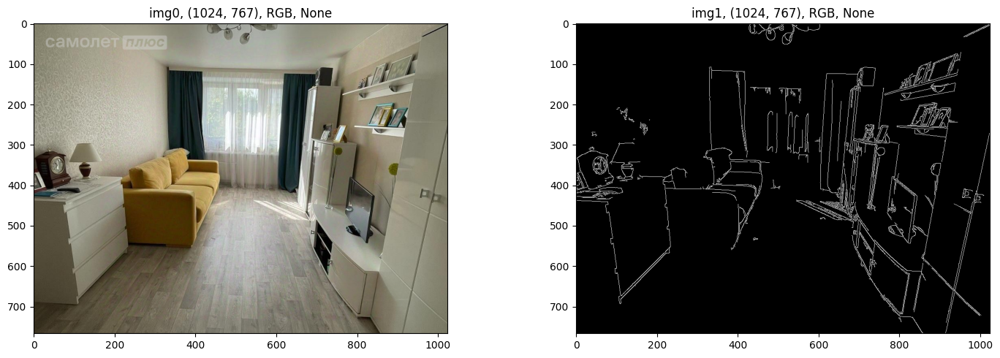

In [11]:
from diffusers import StableDiffusionXLControlNetPipeline, ControlNetModel, AutoencoderKL
from diffusers.utils import load_image
import numpy as np
import torch

import cv2
from PIL import Image

img_canny = np.array(img_pil).copy()
img_canny = cv2.Canny(img_canny, 100, 300)
img_canny = img_canny[:, :, None]
img_canny = np.concatenate([img_canny, img_canny, img_canny], axis=2)
img_canny = Image.fromarray(img_canny)
display_images([img_pil, img_canny])

In [12]:
controlnet = ControlNetModel.from_pretrained(
    "diffusers/controlnet-canny-sdxl-1.0",
    torch_dtype=torch.float16,
    cache_dir=CACHE_DIR
).to(DEVICE)
# vae = AutoencoderKL.from_pretrained("madebyollin/sdxl-vae-fp16-fix", torch_dtype=torch.float16, cache_dir=CACHE_DIR)
pipe = StableDiffusionXLControlNetPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    controlnet=controlnet,
    # vae=vae,
    torch_dtype=torch.float16,
    cache_dir=CACHE_DIR
).to(DEVICE)
# pipe.enable_model_cpu_offload()

config.json:   0%|          | 0.00/1.31k [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/5.00G [00:00<?, ?B/s]

Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/10.3G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/2.78G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

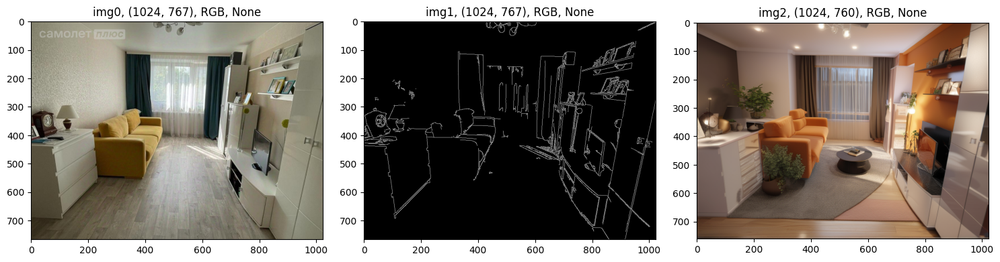

CPU times: user 26.4 s, sys: 3.94 s, total: 30.3 s
Wall time: 29.3 s


In [15]:
%%time

prompt = ["New modern style of livingroom, warm color palette, detailed, 8k"]
negative_prompt = ["low quality, bad quality, sketches"]

img_gen = pipe(
    prompt, 
    negative_prompt=negative_prompt, 
    image=img_canny, 
    controlnet_conditioning_scale=0.6,
    guidance_scale=9,
    eta=0.0,
    generator=torch.Generator(DEVICE).manual_seed(2),
    num_inference_steps=100
)

display_images([img_pil, img_canny] + img_gen.images)

## diffusers/controlnet-depth-sdxl-1.0

- https://huggingface.co/diffusers/controlnet-depth-sdxl-1.0

- for the depth map we will use dpt-beit-large-512 model instead dpt-hybrid-midas (as in the example with diffusers)
- the benchmark of the depth models: https://github.com/isl-org/MiDaS/tree/master

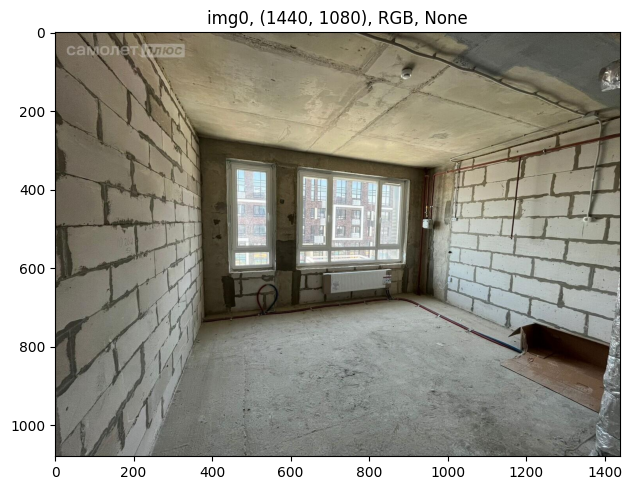

In [4]:
img_pil = Image.open('data/img5003_PrimaryHouse.jpg').convert('RGB')
display_images([img_pil])

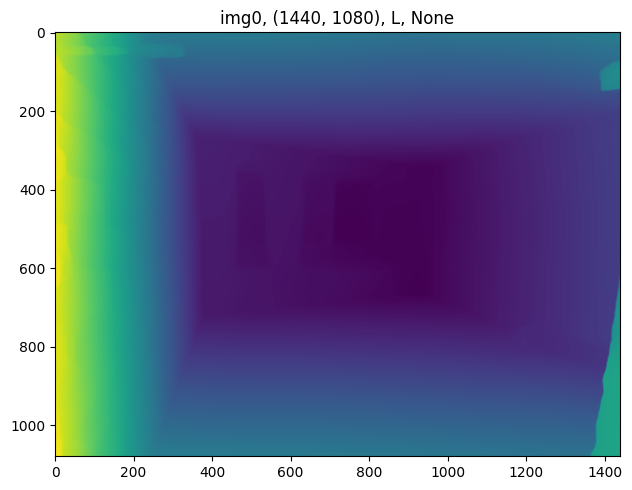

CPU times: user 1min 30s, sys: 29.1 s, total: 1min 59s
Wall time: 3.43 s


In [15]:
%%time

from transformers import DPTImageProcessor, DPTForDepthEstimation
from diffusers import ControlNetModel, StableDiffusionXLControlNetPipeline, AutoencoderKL


processor = DPTImageProcessor.from_pretrained("Intel/dpt-beit-large-512", cache_dir=CACHE_DIR)
model = DPTForDepthEstimation.from_pretrained("Intel/dpt-beit-large-512", cache_dir=CACHE_DIR)#.to(DEVICE)

# prepare image for the model
inputs = processor(images=img_pil, return_tensors="pt")

with torch.no_grad():
    outputs = model(**inputs)
    predicted_depth = outputs.predicted_depth

# interpolate to original size
prediction = torch.nn.functional.interpolate(
    predicted_depth.unsqueeze(1),
    size=img_pil.size[::-1],
    mode="bicubic",
    align_corners=False,
)

# visualize the prediction
output = prediction.squeeze().cpu().numpy()
formatted = (output * 255 / np.max(output)).astype("uint8")
img_depth = Image.fromarray(formatted)
display_images([img_depth])

In [16]:
%%time

controlnet = ControlNetModel.from_pretrained(
    "diffusers/controlnet-depth-sdxl-1.0",
    variant="fp16",
    use_safetensors=True,
    torch_dtype=torch.float16,
    cache_dir=CACHE_DIR
).to(DEVICE)

# vae = AutoencoderKL.from_pretrained("madebyollin/sdxl-vae-fp16-fix", torch_dtype=torch.float16).to(DEVICE)
pipe = StableDiffusionXLControlNetPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    controlnet=controlnet,
    # vae=vae,
    variant="fp16",
    use_safetensors=True,
    torch_dtype=torch.float16,
    cache_dir=CACHE_DIR
).to(DEVICE)
# pipe.enable_model_cpu_offload()

# pipe.load_lora_weights('/home/a.lugovoi/Git/rnd-tasks/generative-ai/models/tuned/MODEL_STYLE1/5000/pytorch_lora_weights.safetensors')
# pipe = pipe.to(DEVICE)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

CPU times: user 2.35 s, sys: 926 ms, total: 3.28 s
Wall time: 3.8 s


  0%|          | 0/100 [00:00<?, ?it/s]

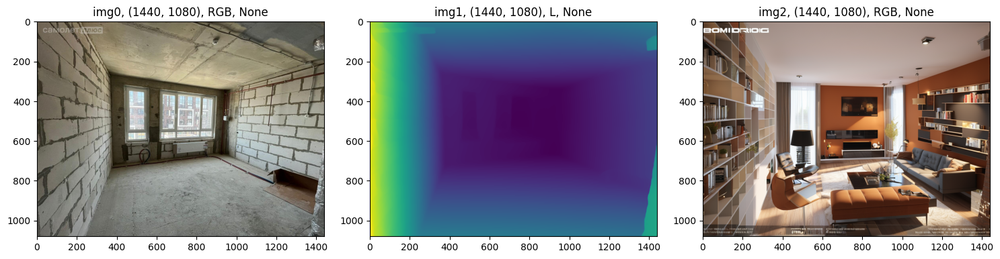

CPU times: user 38.9 s, sys: 11.8 s, total: 50.8 s
Wall time: 49.7 s


In [17]:
%%time

prompt = ["New modern style of livingroom, warm color palette, detailed, 8k"]
negative_prompt = ["low quality, bad quality, sketches"]

img_gen = pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    image=img_depth,
    guidance_scale=13,
    num_images_per_prompt=1,
    num_inference_steps=100, 
    controlnet_conditioning_scale=0.5,
    generator = torch.Generator(DEVICE).manual_seed(8)
)

display_images([img_pil, img_depth] + img_gen.images)

## StableDiffusionXLControlNetImg2ImgPipeline

- https://huggingface.co/docs/diffusers/api/pipelines/controlnet_sdxl#diffusers.StableDiffusionXLControlNetImg2ImgPipeline

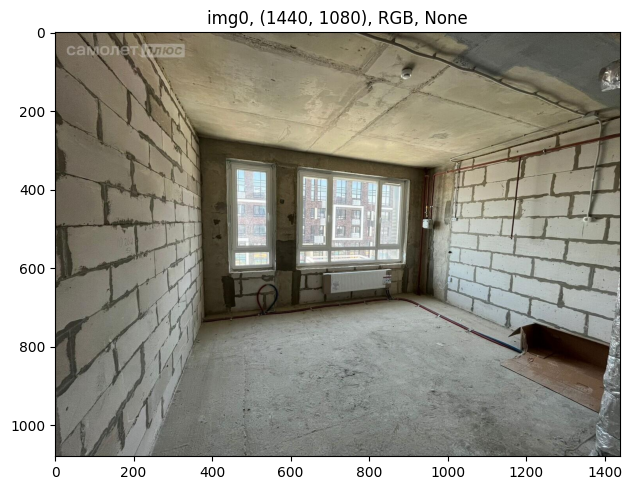

In [3]:
img_pil = Image.open('data/img5003_PrimaryHouse.jpg').convert('RGB')
display_images([img_pil])

2024-05-20 09:09:05.495520: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-05-20 09:09:05.498666: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-05-20 09:09:05.559099: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-20 09:09:06.523882: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


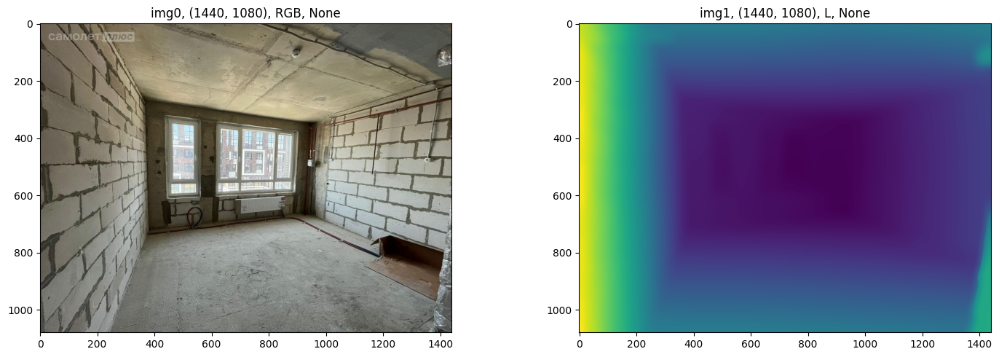

CPU times: user 1min 57s, sys: 33 s, total: 2min 30s
Wall time: 9.3 s


In [4]:
%%time

from transformers import DPTImageProcessor, DPTForDepthEstimation
from diffusers import ControlNetModel, StableDiffusionXLControlNetImg2ImgPipeline


processor = DPTImageProcessor.from_pretrained("Intel/dpt-beit-large-512", cache_dir=CACHE_DIR)
model = DPTForDepthEstimation.from_pretrained("Intel/dpt-beit-large-512", cache_dir=CACHE_DIR)#.to(DEVICE)

# prepare image for the model
inputs = processor(images=img_pil, return_tensors="pt")

with torch.no_grad():
    outputs = model(**inputs)
    predicted_depth = outputs.predicted_depth

# interpolate to original size
prediction = torch.nn.functional.interpolate(
    predicted_depth.unsqueeze(1),
    size=img_pil.size[::-1],
    mode="bicubic",
    align_corners=False,
)

# visualize the prediction
output = prediction.squeeze().cpu().numpy()
formatted = (output * 255 / np.max(output)).astype("uint8")

formatted = cv2.bilateralFilter(formatted, 50, 90, 90)

img_depth = Image.fromarray(formatted)
display_images([img_pil, img_depth])

In [5]:
%%time

controlnet = ControlNetModel.from_pretrained(
    'diffusers/controlnet-depth-sdxl-1.0-small',
    variant="fp16",
    use_safetensors=True,
    torch_dtype=torch.float16,
    cache_dir=CACHE_DIR
).to(DEVICE)

pipe = StableDiffusionXLControlNetImg2ImgPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    controlnet=controlnet,
    variant="fp16",
    use_safetensors=True,
    torch_dtype=torch.float16,
    cache_dir=CACHE_DIR
).to(DEVICE)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

CPU times: user 2.23 s, sys: 851 ms, total: 3.08 s
Wall time: 3.67 s


In [11]:
import yaml
from pprint import pprint 
with open('/home/a.lugovoi/Git/rnd-tasks/generative-ai/notebooks/style/style_prompts.yml', 'r', encoding='utf-8') as file:
    STYLE_PROMPTS = yaml.safe_load(file)

In [13]:
style = 'STYLE_1'
room = 'livingroom'

PROMPT = 'livingroom, ' + STYLE_PROMPTS[style]['prompt'] + STYLE_PROMPTS['QUALITY']['prompt']
NEGATIVE_PROMPT = STYLE_PROMPTS[style]['negative_prompt'] + STYLE_PROMPTS['QUALITY']['negative_prompt']

print(len(PROMPT.split()))
pprint(PROMPT)
print(len(NEGATIVE_PROMPT.split()))
pprint(NEGATIVE_PROMPT)

39
('livingroom, Modern Interior Style, Clear lines and shapes, Mixed lighting, '
 'Functionality with high-quality finish, Minimalism using modern materials, '
 'Neutral color palette with matte surfaces, Open spaces with technological '
 'featuresdenoise, true-to-life textures, photorealistic, hyperrealistic, '
 'highly detailed, high definition, 8k resolution')
34
('Enclosed, isolated spaces, Classic furniture with heavy textiles and '
 'excessive decoration, Decorative wall patterns, moldings, cornices, '
 'Traditional materials, Bright, contrasting colors and patternslow quality, '
 'sketch, cartoon, deformed, distortions, messy, exaggerated proportions, '
 'blurry, unfocused, surreal')


  0%|          | 0/135 [00:00<?, ?it/s]

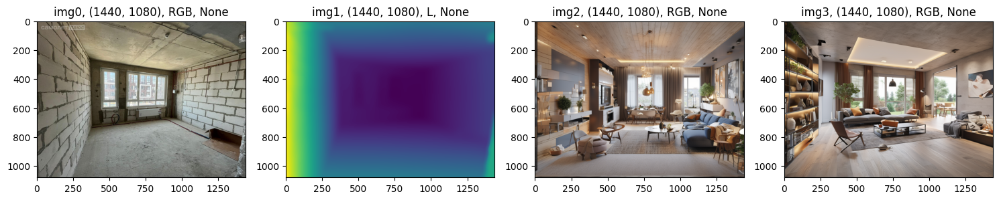

CPU times: user 1min 16s, sys: 21.1 s, total: 1min 37s
Wall time: 1min 35s


In [19]:
%%time

prompt = ["New modern style of livingroom, warm color palette, detailed, 8k"]
negative_prompt = ["low quality, bad quality, sketches"]

img_gen = pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    image=img_pil,
    control_image=img_depth,
    strength=0.9,
    eta=0.0,
    num_inference_steps=150,
    controlnet_conditioning_scale=0.4,
    guidance_scale=12,
    num_images_per_prompt=2,
    generator = torch.Generator(DEVICE).manual_seed(23)
)

display_images([img_pil, img_depth] + img_gen.images)

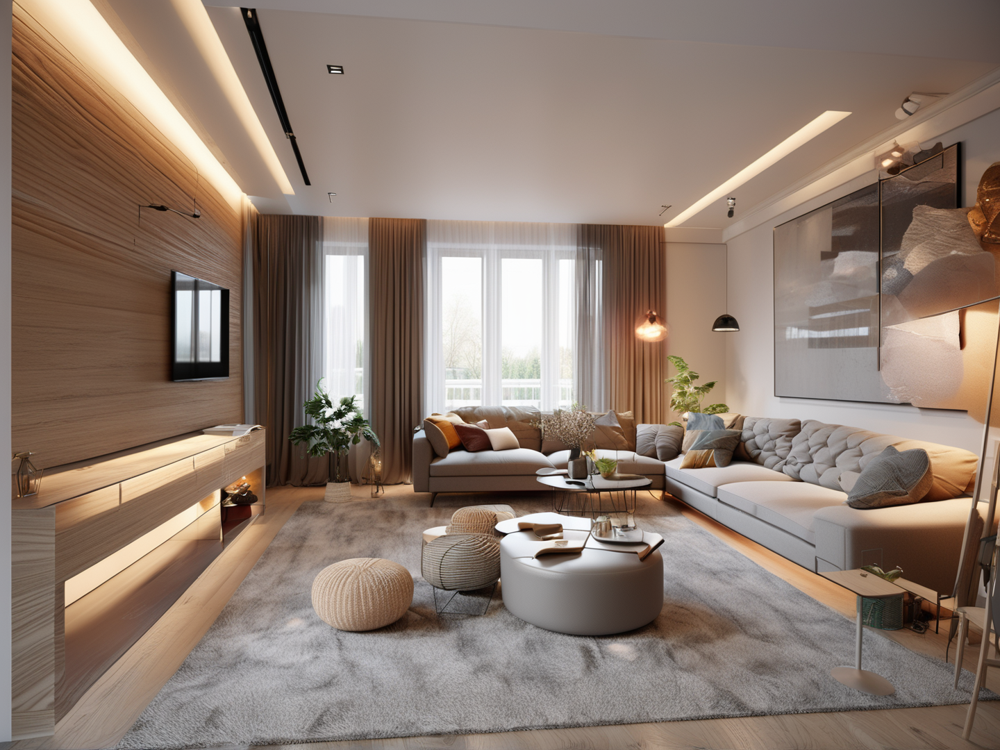

In [15]:
img_gen.images[0]

# END